In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
import os
import torch
from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
import gtsam

In [4]:
def read_imgs_from_folder(path):
    og_images = []
    gray_images = []
    for image in sorted(os.listdir(path)):
        original_image = (cv2.cvtColor(cv2.imread(os.path.join(path, image)), cv2.COLOR_BGR2RGB))
        gray_img = cv2.normalize(cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY), None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
        og_images.append(original_image)
        gray_images.append(gray_img)

    num_imgs_mosaic = len(og_images)
    print(num_imgs_mosaic)
    subplot_rows = math.ceil(math.sqrt(num_imgs_mosaic))
    subplot_cols = math.ceil(num_imgs_mosaic/subplot_rows)
    _, ax = plt.subplots(subplot_rows, subplot_cols, figsize=(22, 10))
    ax = ax.flatten()

    for img in range(subplot_rows*subplot_cols):
        if img < num_imgs_mosaic:
            ax[img].imshow(gray_images[img], cmap="gray")
            ax[img].set_title(f"Image {img+1}")

        ax[img].axis("off")

    plt.tight_layout()
    plt.show()

    return og_images, gray_images, num_imgs_mosaic


6


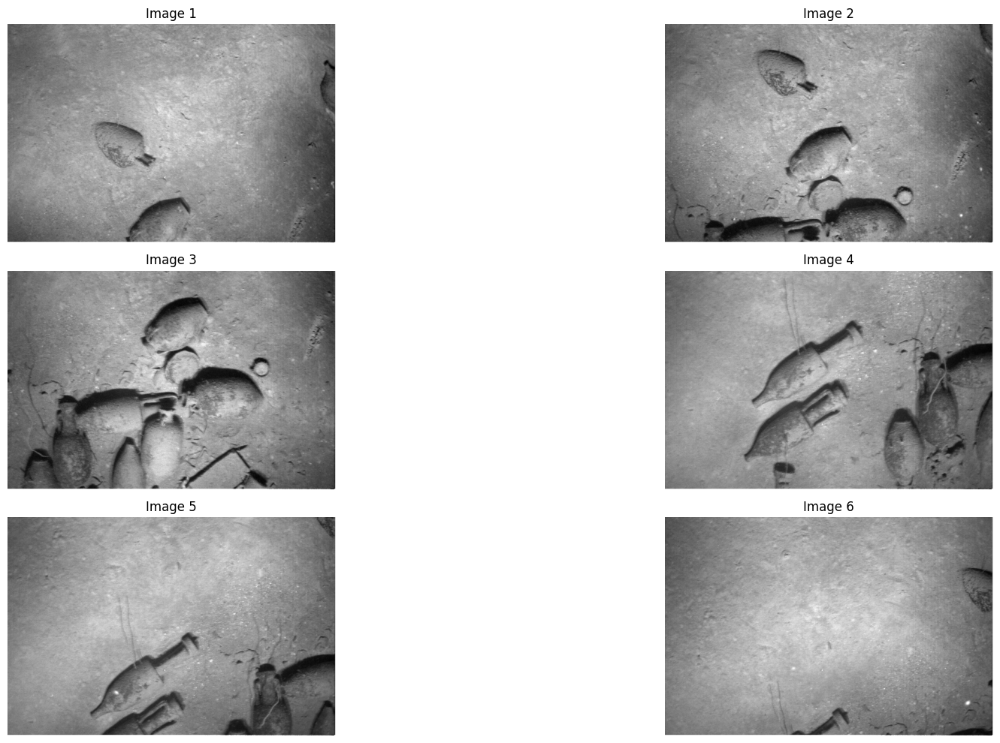

In [5]:
og_images6, gray_images6, num_images6 = read_imgs_from_folder("6Images")

In [6]:
def normalize_images(gray_images):
  clahe_imgs = []
  clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  for img in gray_images:
      clahe_imgs.append(clahe.apply(img))

  return clahe_imgs

In [8]:
# Set device
device = torch.device('mps' if torch.cuda.is_available() else 'cpu')

# Initialize feature extractor and matcher globally
extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)
matcher = LightGlue(features='superpoint').eval().to(device)

I have used SIFT as well as LightGlue to just do a comparison of both feature matching algorithms.

In [9]:
def detect_keypoints_sift(gray_images, num_images):
    sift = cv2.SIFT_create(
        nfeatures=5000,  # Maximum number of features (0 = no limit)
        nOctaveLayers=4,  # Number of layers in each octave
        contrastThreshold=0.04,  # Contrast threshold for filtering weak features
        edgeThreshold=10,  # Edge threshold
        sigma=1.6  # Sigma of Gaussian
    )

    normalized_images = normalize_images(gray_images)

    listKeypoints = []
    listDescriptors = []

    for img in range(num_images):
        keypoints, descriptors = sift.detectAndCompute(normalized_images[img], None)
        listKeypoints.append(keypoints)
        listDescriptors.append(descriptors)

    subplot_rows = math.ceil(math.sqrt(num_images))
    subplot_cols = math.ceil(num_images/subplot_rows)

    _, ax = plt.subplots(subplot_rows, subplot_cols, figsize=(22, 10))
    ax = ax.flatten()

    for img in range(subplot_rows*subplot_cols):
        if img < num_images:
            ax[img].imshow(cv2.drawKeypoints(normalized_images[img], listKeypoints[img], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
            ax[img].set_title(f"Image {img+1}")

        ax[img].axis("off")

    plt.tight_layout()
    plt.show()

    return listKeypoints, listDescriptors

def detect_keypoints_lightglue(gray_images, num_images):
    """Detect keypoints using SuperPoint"""

    listKeypoints = []
    listDescriptors = []
    listScores = []  # Store scores for later use

    for img_idx in range(num_images):
        # Convert grayscale image to torch tensor
        if len(gray_images[img_idx].shape) == 2:
            image_tensor = torch.from_numpy(gray_images[img_idx]).float()[None, None] / 255.0
        else:
            image_tensor = torch.from_numpy(gray_images[img_idx]).float()[None] / 255.0
            if image_tensor.shape[1] == 3:
                # Convert RGB to grayscale if needed
                image_tensor = torch.mean(image_tensor, dim=1, keepdim=True)

        image_tensor = image_tensor.to(device)

        # Extract features
        with torch.no_grad():
            feats = extractor.extract(image_tensor)

        # Convert to OpenCV format
        keypoints_np = feats['keypoints'][0].cpu().numpy()
        descriptors_np = feats['descriptors'][0].cpu().numpy().T  # Transpose to match OpenCV format
        # scores_np = feats['scores'][0].cpu().numpy()
                # Handle scores - SuperPoint may have 'keypoint_scores' or 'scores'
        if 'keypoint_scores' in feats:
            scores_np = feats['keypoint_scores'][0].cpu().numpy()
        elif 'scores' in feats:
            scores_np = feats['scores'][0].cpu().numpy()
        else:
            # If no scores available, create default scores
            scores_np = np.ones(len(keypoints_np))

        # Convert to OpenCV KeyPoint format
        keypoints_cv = []
        for i, (x, y) in enumerate(keypoints_np):
            kp = cv2.KeyPoint(x=float(x), y=float(y), size=1.0, response=float(scores_np[i]))
            keypoints_cv.append(kp)

        listKeypoints.append(keypoints_cv)
        listDescriptors.append(descriptors_np)
        listScores.append(scores_np)

    # Visualization
    subplot_rows = math.ceil(math.sqrt(num_images))
    subplot_cols = math.ceil(num_images/subplot_rows)

    _, ax = plt.subplots(subplot_rows, subplot_cols, figsize=(22, 10))
    ax = ax.flatten()

    for img in range(subplot_rows*subplot_cols):
        if img < num_images:
            ax[img].imshow(cv2.drawKeypoints(gray_images[img], listKeypoints[img],
                                            None, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
            ax[img].set_title(f"Image {img+1} - {len(listKeypoints[img])} keypoints")
        ax[img].axis("off")

    plt.tight_layout()
    plt.show()

    return listKeypoints, listDescriptors

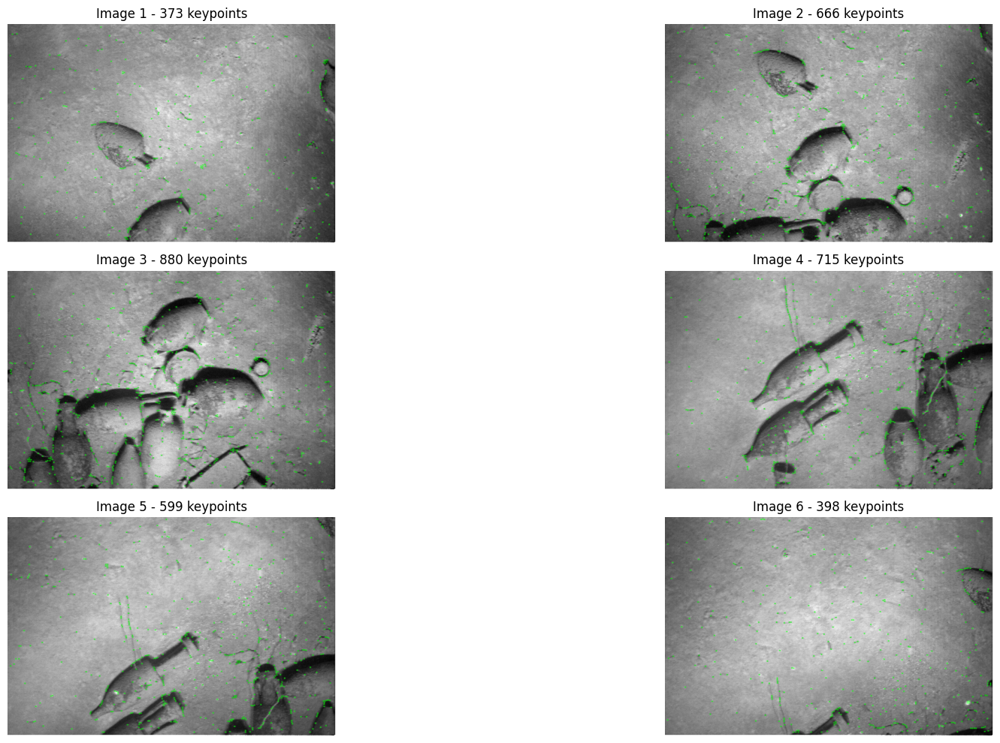

In [10]:
keypoints6, descriptors6 = detect_keypoints_lightglue(gray_images6, num_images6)

In [11]:
def match_sift_features(img1, img2, kp1, kp2, dsc1, dsc2):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Perform kNN matching with k=2 for Lowe's ratio test
    matches = flann.knnMatch(dsc1, dsc2, k=2)
    good_matches = []
    src_points = []
    dst_points = []

    for m,n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append([m])
            src_points.append(kp1[m.queryIdx].pt)
            dst_points.append(kp2[m.trainIdx].pt)

    src_points = np.float32(src_points).reshape(-1,1,2)
    dst_points = np.float32(dst_points).reshape(-1,1,2)

    return src_points, dst_points, good_matches

def check_homography(H, mask_of_inliers, src_pts, dst_pts):
    # inliers_count = np.count_nonzero(mask_of_inliers)
    """Check homography quality (unchanged)"""
    if H is None or mask_of_inliers is None:
        return float('inf')

    inliers_count = np.count_nonzero(mask_of_inliers)
    if inliers_count == 0:
        return float('inf')
    inliers_idx = np.where(mask_of_inliers == 1)
    src = src_pts[inliers_idx[0]]
    dst = dst_pts[inliers_idx[0]]

    src_transformed = cv2.perspectiveTransform(src, H)
    errors = np.linalg.norm(src_transformed.reshape(-1, 2) - dst.reshape(-1, 2), axis=1)
    covariance = 1000*np.mean(errors)/(inliers_count**2)

    return covariance

def match_lightglue_features(img1, img2, kp1, kp2, dsc1, dsc2):
    """Match features using LightGlue"""

    # Convert keypoints back to torch format
    kp1_np = np.array([[kp.pt[0], kp.pt[1]] for kp in kp1], dtype=np.float32)
    kp2_np = np.array([[kp.pt[0], kp.pt[1]] for kp in kp2], dtype=np.float32)

    kp1_torch = torch.from_numpy(kp1_np).to(device)
    kp2_torch = torch.from_numpy(kp2_np).to(device)

    # Convert descriptors to torch format
    dsc1_torch = torch.from_numpy(dsc1.T).to(device)  # Transpose back
    dsc2_torch = torch.from_numpy(dsc2.T).to(device)

    # Get scores from keypoints (if available)
    scores1 = torch.tensor([kp.response for kp in kp1]).to(device)
    scores2 = torch.tensor([kp.response for kp in kp2]).to(device)

    # Prepare data for LightGlue
    data = {
        'image0': {'keypoints': kp1_torch.unsqueeze(0),
                   'descriptors': dsc1_torch.unsqueeze(0),
                   'keypoint_scores': scores1.unsqueeze(0)},
        'image1': {'keypoints': kp2_torch.unsqueeze(0),
                   'descriptors': dsc2_torch.unsqueeze(0),
                   'keypoint_scores': scores2.unsqueeze(0)}
    }

    # Perform matching
    with torch.no_grad():
        pred = matcher(data)

    # Get matches
    matches0 = pred['matches0'][0].cpu().numpy()
    matching_scores = pred['matching_scores0'][0].cpu().numpy()

    # Filter valid matches (LightGlue uses -1 for unmatched points)
    valid_matches = matches0 >= 0

    # Extract matched points
    src_points = []
    dst_points = []
    good_matches = []

    for i, (is_valid, match_idx) in enumerate(zip(valid_matches, matches0)):
        if is_valid:
            src_points.append(kp1[i].pt)
            dst_points.append(kp2[match_idx].pt)
            # Create DMatch-like object for visualization
            m = cv2.DMatch(i, match_idx, matching_scores[i])
            good_matches.append([m])

    src_points = np.float32(src_points).reshape(-1, 1, 2)
    dst_points = np.float32(dst_points).reshape(-1, 1, 2)

    return src_points, dst_points, good_matches


In [12]:
# Match consecutive pairs
def show_sift_matches(gray_images, num_images, keypoints, descriptors):
  homographies = [np.identity(3)]
  temporal_matches = {}
  for i in range(num_images - 1):
      src_pts, dst_pts, good_matches = match_sift_features(gray_images[i], gray_images[i+1], keypoints[i], keypoints[i+1], descriptors[i], descriptors[i+1])

      # Find homography using RANSAC
      homography, mask_of_inliers = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 10.0)
      covariance = check_homography(homography, mask_of_inliers, src_pts, dst_pts)

      temporal_matches[(i, i+1)] = {"H": homography, "error": covariance}

      homographies.append(homography)

      plt.figure()
      matches_img = cv2.drawMatchesKnn(gray_images[i], keypoints[i], gray_images[i+1], keypoints[i+1], good_matches, None, matchesMask=mask_of_inliers, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
      plt.imshow(matches_img)
      plt.axis('off')
      plt.title("Inliers after RANSAC")
      plt.tight_layout()

  return homographies, temporal_matches

def show_lightglue_matches(gray_images, num_images, keypoints, descriptors):
    """Match consecutive pairs (unchanged except for function calls)"""
    homographies = [np.identity(3)]
    temporal_matches = {}

    for i in range(num_images - 1):
        src_pts, dst_pts, good_matches = match_lightglue_features(
            gray_images[i], gray_images[i+1],
            keypoints[i], keypoints[i+1],
            descriptors[i], descriptors[i+1]
        )

        # Find homography using RANSAC
        if len(src_pts) >= 4:
            homography, mask_of_inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, None, cv2.RANSAC, 10.0)
            homography = np.append(homography, [[0,0,1]], axis=0)
            covariance = check_homography(homography, mask_of_inliers, src_pts, dst_pts)
        else:
            homography = np.identity(3)
            mask_of_inliers = np.zeros(len(src_pts), dtype=np.uint8)
            covariance = float('inf')

        temporal_matches[(i, i+1)] = {"H": homography, "error": covariance}
        homographies.append(homography)

        # Visualization
        plt.figure()
        if len(good_matches) > 0 and mask_of_inliers is not None:
            matches_img = cv2.drawMatchesKnn(
                gray_images[i], keypoints[i],
                gray_images[i+1], keypoints[i+1],
                good_matches, None,
                matchesMask=mask_of_inliers,
                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
            )
        else:
            matches_img = cv2.drawMatchesKnn(
                gray_images[i], keypoints[i],
                gray_images[i+1], keypoints[i+1],
                good_matches, None,
                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
            )

        plt.imshow(matches_img)
        plt.axis('off')
        plt.title(f"Inliers after RANSAC - {np.count_nonzero(mask_of_inliers)} matches")
        plt.tight_layout()

    return homographies, temporal_matches

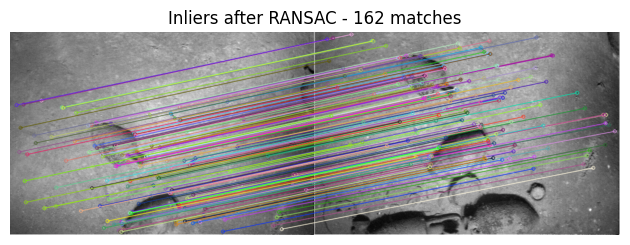

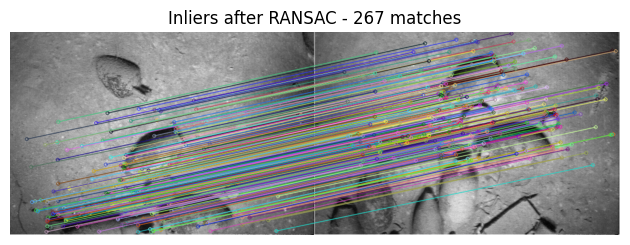

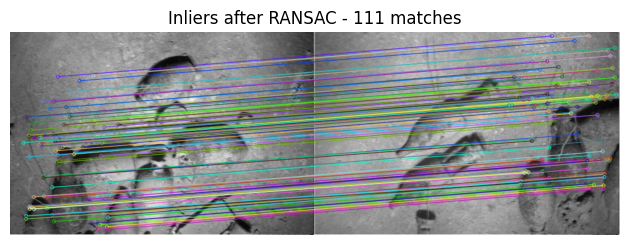

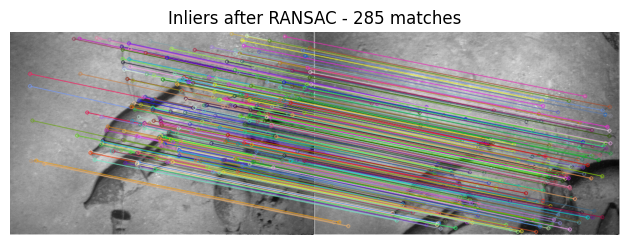

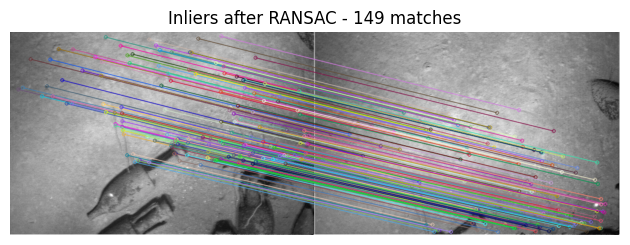

In [13]:
homographies6, temporal_matches6 = show_lightglue_matches(gray_images6, num_images6, keypoints6, descriptors6)

In [14]:
def get_homography(num_images, homographies):
  homographies_for_mosaic = [np.linalg.inv(homographies[i]) for i in range(num_images)]
  for i in range(1, num_images):
      homographies_for_mosaic[i] = homographies_for_mosaic[i-1] @ homographies_for_mosaic[i]

  return homographies_for_mosaic

In [15]:
homographies_for_mosaic6 = get_homography(num_images6, homographies6)
homographies_for_mosaic6

[array([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]),
 array([[ 9.88237942e-01,  1.80525380e-02, -6.74177773e+00],
        [-1.80525380e-02,  9.88237942e-01,  1.29929508e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.82038284e-01,  1.34238913e-02, -2.48004265e+01],
        [-1.34238913e-02,  9.82038284e-01,  2.59291469e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.63721719e-01, -1.92719674e-02, -3.58994383e+02],
        [ 1.92719674e-02,  9.63721719e-01,  3.24018678e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.68834763e-01, -3.35323659e-02, -3.43473751e+02],
        [ 3.35323659e-02,  9.68834763e-01,  2.07097301e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.91112631e-01, -5.24057056e-02, -3.28315214e+02],
        [ 5.24057056e-02,  9.91112631e-01,  6.52687004e+01],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])]

In [16]:
def calculate_canvas_size(homographies, img_shape):
    img_w, img_h = img_shape
    img_corners = np.array([[0, 0], [0, img_w], [img_h, img_w], [img_h, 0]], dtype=np.float32).reshape(-1, 1, 2)

    min_x = min_y = np.inf
    max_x = max_y = -np.inf

    for i, H in enumerate(homographies):
        transformed_corners = cv2.perspectiveTransform(np.copy(img_corners), H)
        transformed_corners_x = transformed_corners.ravel()[::2]
        transformed_corners_y = transformed_corners.ravel()[1::2]

        min_x = min(min_x, *transformed_corners_x)
        max_x = max(max_x, *transformed_corners_x)
        min_y = min(min_y, *transformed_corners_y)
        max_y = max(max_y, *transformed_corners_y)

    return min_x, min_y, max_x, max_y

In [17]:
minx6, miny6, maxx6, maxy6 = calculate_canvas_size(homographies_for_mosaic6, gray_images6[0].shape)
print(minx6, miny6, maxx6, maxy6)

-366.3948 0.0 576.0 705.1885


In [18]:
def warp_images(images, num_images, H, min_x, min_y, max_x, max_y):
    T = np.array([[1, 0, abs(min_x)],
                  [0, 1, abs(min_y)],
                  [0, 0,    1   ]])

    warped_images = []
    canvas_shape = (int(max_x-min_x), int(max_y-min_y))

    for i in range(num_images):
        warped_img = cv2.warpPerspective(np.copy(images[i]), T @ H[i], canvas_shape)
        warped_images.append(warped_img)

    for i in range(num_images):
        plt.figure()
        plt.imshow(warped_images[i], cmap="gray")
        plt.axis("off")
        plt.title(f"Warped Image {i+1}")

    return warped_images

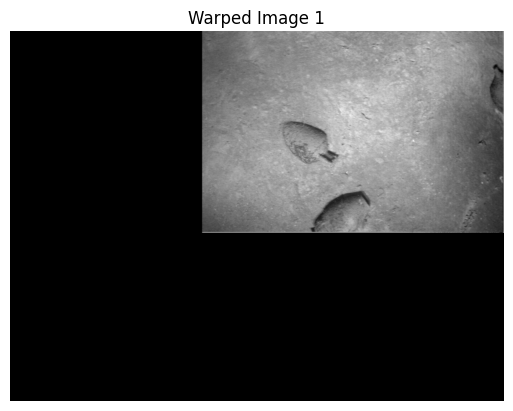

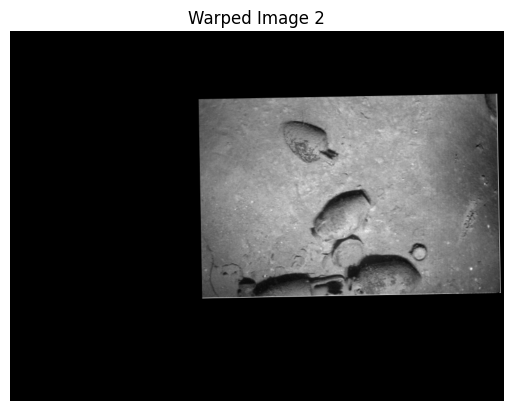

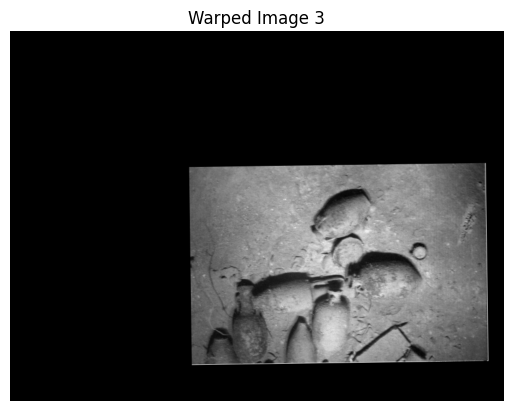

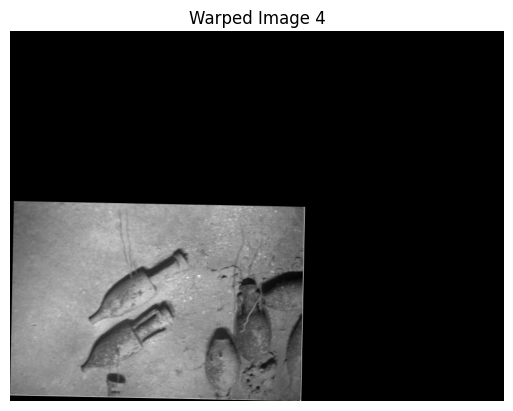

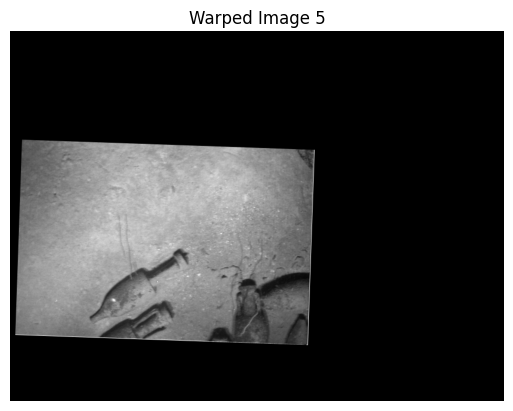

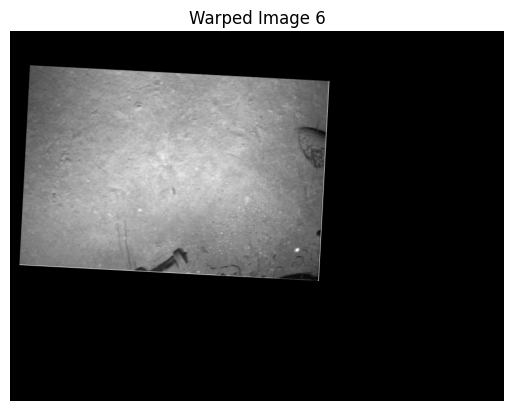

In [19]:
warped_images6 = warp_images(gray_images6, num_images6, homographies_for_mosaic6, minx6, miny6, maxx6, maxy6)

In [20]:
def show_panoroma(warped_images, homographies, img_shape, min_x, min_y):
    w, h = warped_images[0].shape
    panorama = np.zeros((w, h), dtype=np.float32)
    count_map = np.zeros((w, h), dtype=np.float32)

    for i in range(len(warped_images)):
        mask = warped_images[i] > 0
        panorama[mask] += warped_images[i][mask].astype(np.float32)
        count_map[mask] += 1

    # Average overlapping regions
    count_map[count_map == 0] = 1
    panorama /= count_map
    panorama = np.clip(panorama, 0, 255).astype(np.uint8)

    plt.figure(figsize=(12, 10))
    plt.imshow(panorama, cmap='gray')
    plt.axis('off')
    plt.title("Final Mosaic")
    plt.show()

    # return panorama

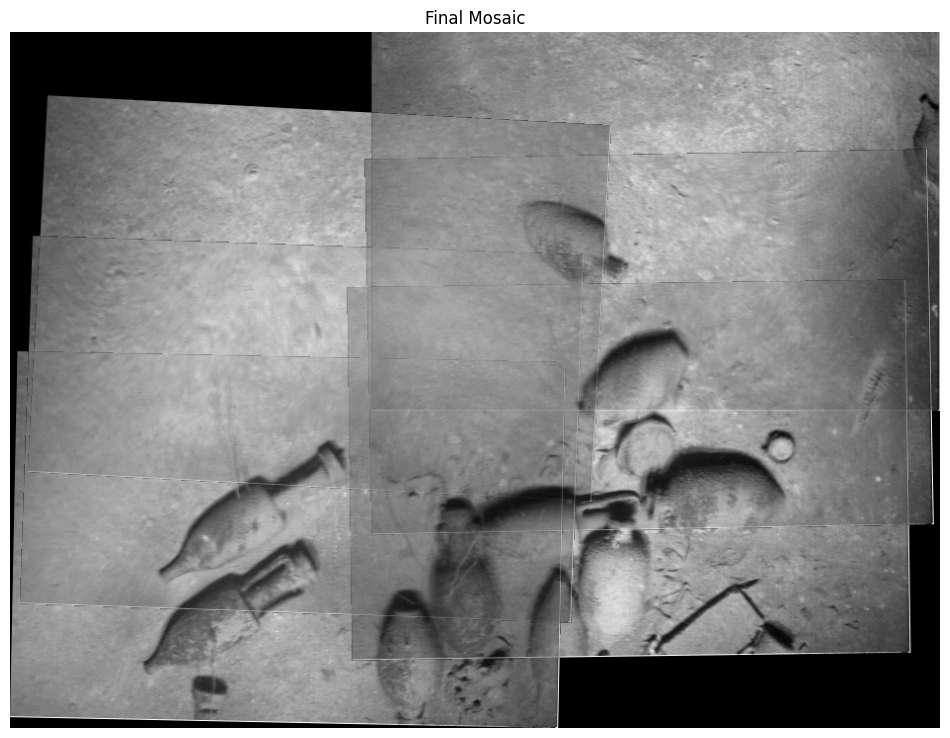

In [21]:
show_panoroma(warped_images6, homographies_for_mosaic6, gray_images6[0].shape, minx6, miny6)

In [22]:
def get_pose_from_homography(H):
    # Normalize homography by making H[2,2] = 1
    H_normalized = H / H[2, 2]

    # # For pure rotation + translation in plane (no scale change expected)
    # # Extract rotation angle from the rotation part of H
    theta_rad = np.arctan2(H_normalized[1, 0], H_normalized[0, 0])

    # # Extract translation (already in the first camera frame)
    tx = H_normalized[0, 2]
    ty = H_normalized[1, 2]

    # For relative pose between consecutive frames, the translation needs to be rotated back
    # to the first frame's coordinate system
    t_local = np.array([tx, ty])

    return (t_local[0], t_local[1], theta_rad)

def get_initial_pose_estimates(H_array):
    poses = []
    x = y = theta = 0
    poses.append((x, y, theta))  # Add initial pose at origin

    for i, H in enumerate(H_array[1:], 1):  # Skip identity matrix at index 0
        # Get relative pose from homography
        dx_local, dy_local, dtheta = get_pose_from_homography(H)

        # Transform translation from local frame to global frame
        # The translation needs to be rotated by the current orientation
        cos_theta = np.cos(theta)
        sin_theta = np.sin(theta)

        dx_global = cos_theta * dx_local - sin_theta * dy_local
        dy_global = sin_theta * dx_local + cos_theta * dy_local

        # Update pose
        x += dx_global
        y += dy_global
        theta += dtheta

        # Normalize angle to [-pi, pi]
        theta = np.arctan2(np.sin(theta), np.cos(theta))

        poses.append((x, y, theta))

    return poses

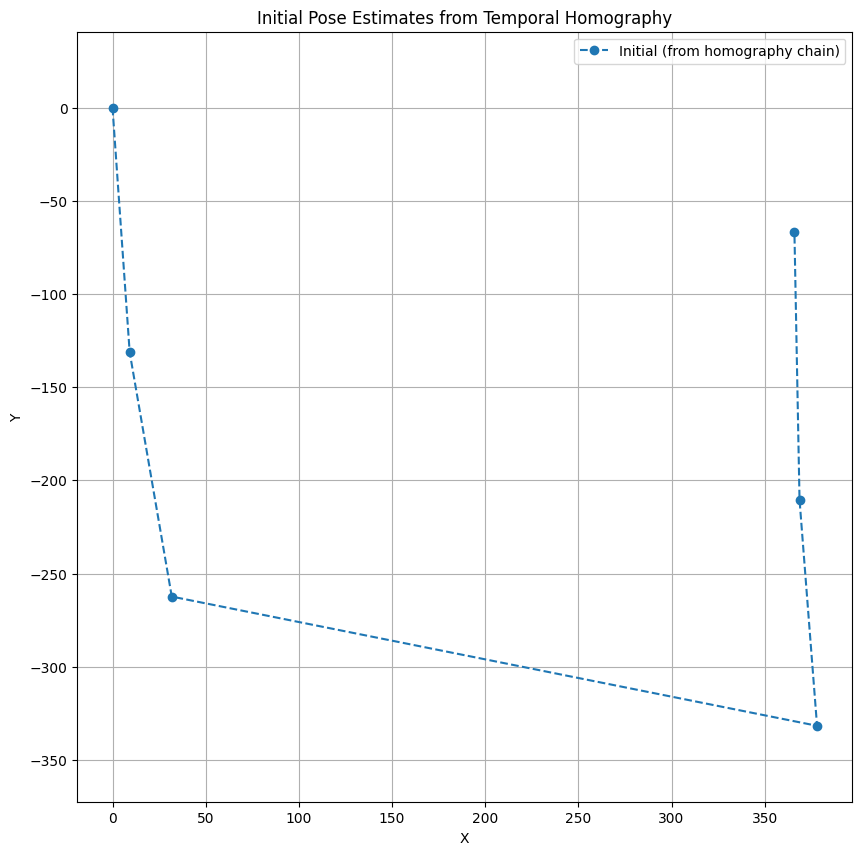

In [23]:
# Get initial pose estimates
initial_pose_estimates6 = get_initial_pose_estimates(homographies6)

# Extract initial poses for plotting
px_init6 = np.array([p[0] for p in initial_pose_estimates6])
py_init6 = np.array([p[1] for p in initial_pose_estimates6])

# Plot initial poses
plt.figure(figsize=(10, 10))
plt.plot(px_init6, py_init6, "--o", label="Initial (from homography chain)")
plt.axis("equal")
plt.grid(True)
plt.title("Initial Pose Estimates from Temporal Homography")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

In [24]:
from itertools import combinations

def non_temporal_matching(images, keypoints, descriptors, num_images, temporal_matches):
    matches_dict = {}

    # Define minimum and maximum frame distance for non-temporal matches
    MIN_FRAME_DISTANCE = 2  # Don't match immediate neighbors
    MAX_FRAME_DISTANCE = num_images  # Can match any distance

    for src_img_idx, des_img_idx in combinations(range(num_images), 2):
        frame_distance = abs(src_img_idx - des_img_idx)

        # Skip temporal matches (already have those)
        if frame_distance == 1:
            continue

        # Ensure consistent ordering
        if src_img_idx > des_img_idx:
            src_img_idx, des_img_idx = des_img_idx, src_img_idx

        # Skip if already processed
        if (src_img_idx, des_img_idx) in matches_dict:
            continue

        # Match features
        src_points, dst_points, _ = match_lightglue_features(images[src_img_idx], images[des_img_idx],
                                                            keypoints[src_img_idx], keypoints[des_img_idx],
                                                            descriptors[src_img_idx], descriptors[des_img_idx])

        # Need minimum points for homography
        if len(src_points) < 8:  # Stricter threshold for non-temporal
            continue

        # Find homography
        H, inliers = cv2.estimateAffinePartial2D(src_points, dst_points, None, cv2.RANSAC, 10.0)
        H = np.append(H, [[0, 0, 1]], axis=0)
        # Normalize homography
        H_normalized = H / H[2, 2]

        # Check homography quality
        covar = check_homography(H_normalized, inliers, src_points, dst_points)

        matches_dict[(src_img_idx, des_img_idx)] = {"H": H_normalized, "error": covar}
    return matches_dict

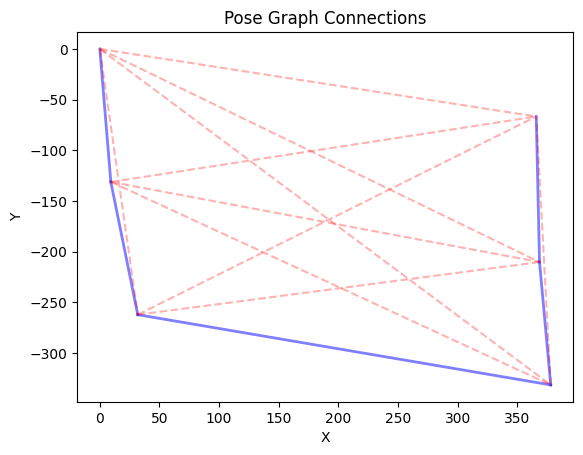

In [25]:
non_temporal_matches6 = non_temporal_matching(gray_images6, keypoints6, descriptors6, num_images6, temporal_matches6)
    # Plot temporal connections
for (src, dst) in temporal_matches6.keys():
    if dst == src + 1:  # Only consecutive
        plt.plot([px_init6[src], px_init6[dst]], [py_init6[src], py_init6[dst]],
                'b-', alpha=0.5, linewidth=2)

# Plot non-temporal connections
for (src, dst) in non_temporal_matches6.keys():
    plt.plot([px_init6[src], px_init6[dst]], [py_init6[src], py_init6[dst]],
            'r--', alpha=0.3, label=f"{src}→{dst}" if len(non_temporal_matches6) < 10 else "")

plt.title("Pose Graph Connections")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

In [26]:
def build_pose_graph(initial_pose_estimates, temporal_matches, non_temporal_matches, num_images, multiplier, values):
    graph = gtsam.NonlinearFactorGraph()

    # Add prior factor for first pose (anchor it at origin)
    prior_noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([values, values, np.deg2rad(values)]))
    graph.add(gtsam.PriorFactorPose2(1, gtsam.Pose2(initial_pose_estimates[0]), prior_noise))

    # Add temporal constraints (consecutive frames)
    for (src_idx, des_idx), match_data in temporal_matches.items():
        if des_idx != src_idx + 1:  # Ensure consecutive
            continue

        H = match_data["H"]
        error = match_data["error"]

        # Get relative pose from homography
        dx, dy, dtheta = get_pose_from_homography(H)

        # Create noise model based on error
        # Scale noise with error but keep it reasonable
        noise = gtsam.noiseModel.Diagonal.Sigmas([error*multiplier, error*multiplier, np.deg2rad(error*multiplier)])

        # Add between factor
        graph.add(gtsam.BetweenFactorPose2(src_idx+1, des_idx+1, gtsam.Pose2(dx, dy, dtheta), noise))

    # Add non-temporal constraints (loop closures)
    for (src_idx, des_idx), match_data in non_temporal_matches.items():
        H = match_data["H"]
        error = match_data["error"]

        # For non-temporal matches, we need to compute the relative pose
        # from src_idx to des_idx using the homography

        # Get relative pose from homography
        dx, dy, dtheta = get_pose_from_homography(H)

        # Create noise model (typically higher uncertainty for loop closures)
        noise = gtsam.noiseModel.Diagonal.Sigmas([error*multiplier, error*multiplier, np.deg2rad(error*multiplier)])

        # Add between factor
        graph.add(gtsam.BetweenFactorPose2(src_idx+1, des_idx+1, gtsam.Pose2(dx, dy, dtheta), noise))

    # Create initial estimates
    initial_estimates = gtsam.Values()
    for idx, pose in enumerate(initial_pose_estimates):
        initial_estimates.insert(idx+1, gtsam.Pose2(*pose))

    return graph, initial_estimates

In [27]:
def optimize_poses(graph, initial_estimates):
    # Set up optimizer parameters
    params = gtsam.LevenbergMarquardtParams()
    params.setVerbosityLM("ERROR")
    params.setMaxIterations(100)
    params.setRelativeErrorTol(1e-5)

    # Optimize
    optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial_estimates, params)
    result = optimizer.optimize()

    # Calculate marginals for uncertainty
    marginals = gtsam.Marginals(graph, result)

    return result, marginals

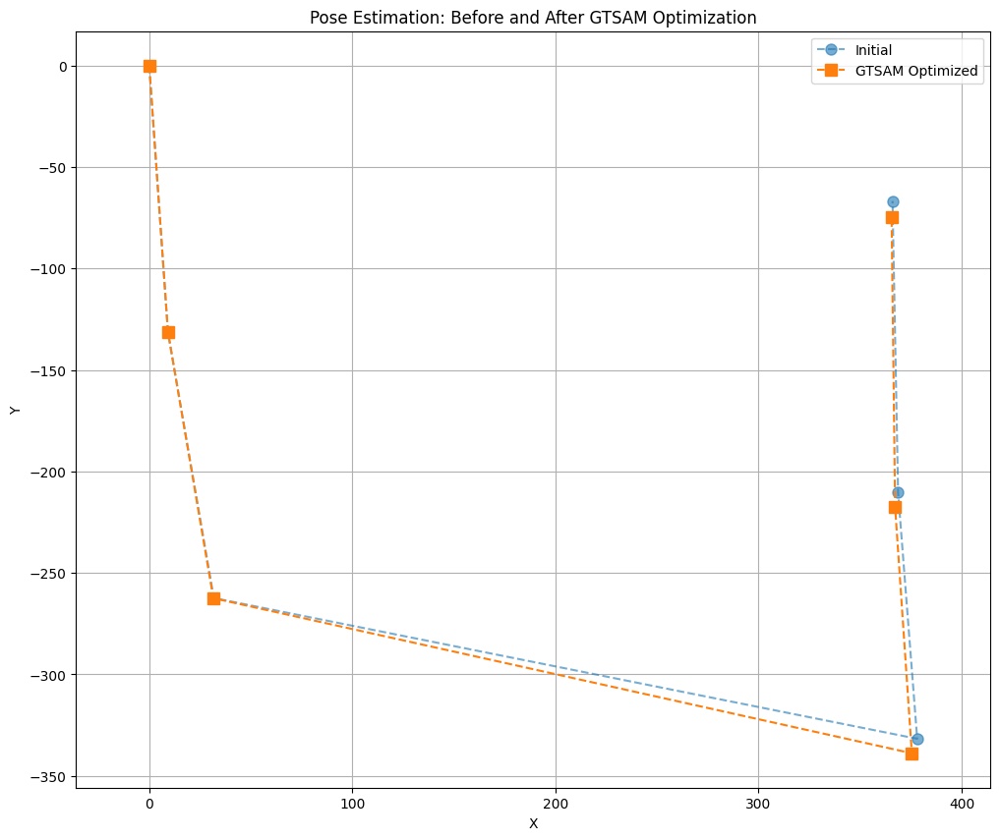

In [28]:
# Build and optimize pose graph
graph6, initial_estimates6 = build_pose_graph(initial_pose_estimates6, temporal_matches6, non_temporal_matches6, num_images6, 0.1, 5)

result6, marginals6 = optimize_poses(graph6, initial_estimates6)

# Extract optimized poses
gtsam_x6 = []
gtsam_y6 = []
gtsam_theta6 = []
for i in range(1, num_images6+1):
    pose6 = result6.atPose2(i)
    gtsam_x6.append(pose6.x())
    gtsam_y6.append(pose6.y())
    gtsam_theta6.append(pose6.theta())

# Plot comparison
plt.figure(figsize=(12, 10))
plt.plot(px_init6, py_init6, "--o", markersize=8, label="Initial", alpha=0.6)
plt.plot(gtsam_x6, gtsam_y6, "--s", markersize=8, label="GTSAM Optimized")

plt.axis("equal")
plt.grid(True)
plt.title("Pose Estimation: Before and After GTSAM Optimization")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

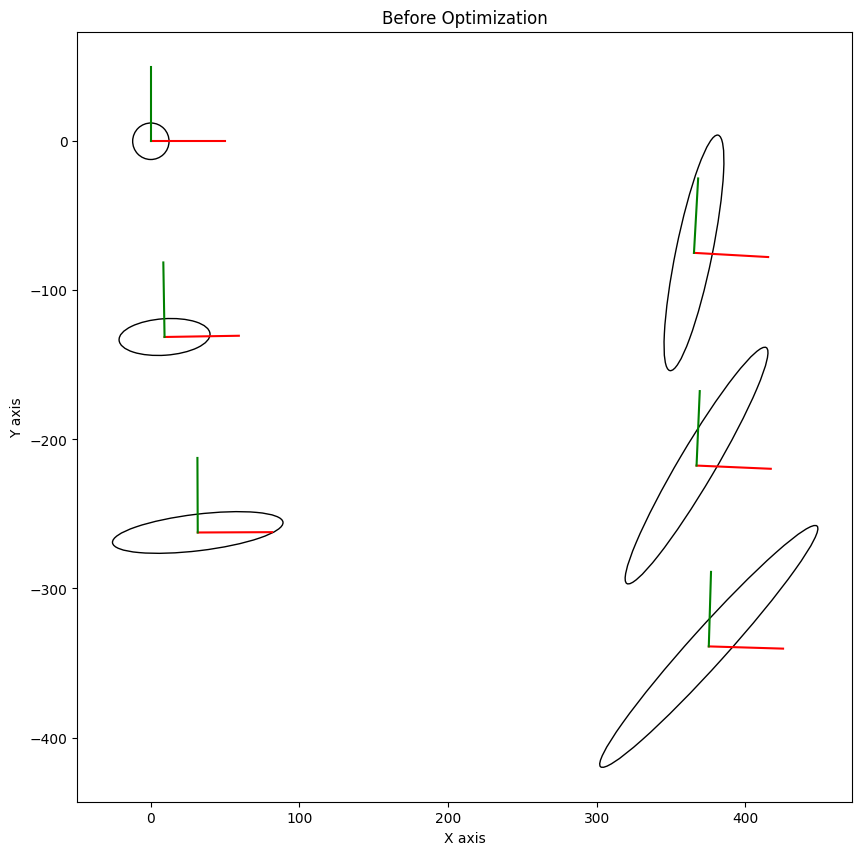

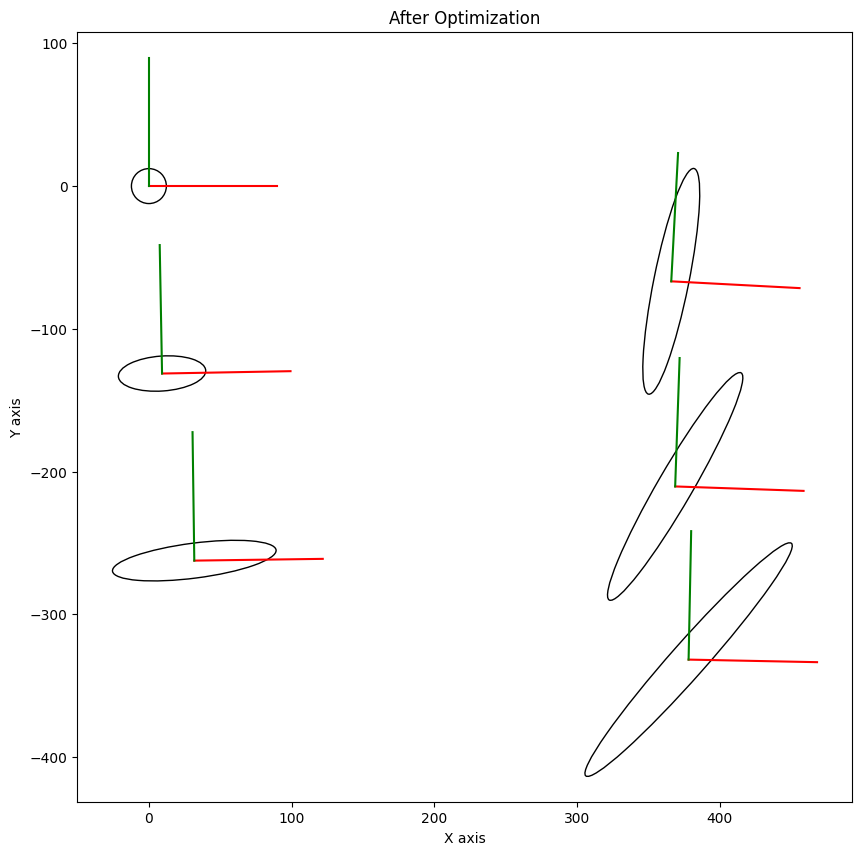

In [29]:
import gtsam.utils.plot as gtsam_plot

plt.figure(figsize=(10,10))
for i in range(1, num_images6+1):
    gtsam_plot.plot_pose2(1, result6.atPose2(i), 50, marginals6.marginalCovariance(i))

plt.title("Before Optimization")
plt.axis("equal")

plt.figure(figsize=(10,10))
for i in range(1, num_images6+1):
    gtsam_plot.plot_pose2(2, initial_estimates6.atPose2(i), 90, marginals6.marginalCovariance(i))

    plt.title("After Optimization")
plt.axis("equal")
plt.show()

In [30]:
def get_homography_post_optimization(poses, num_poses):
    homographies = []

    for i in range(1, num_poses+1):
        tx = poses.atPose2(i).x()
        ty = poses.atPose2(i).y()
        theta = poses.atPose2(i).theta()

        c_theta = np.cos(theta)
        s_theta = np.sin(theta)


        H = np.matrix([[c_theta, -s_theta,  -tx],
                        [s_theta,  c_theta,  -ty],
                        [   0,        0,     1 ]])

        # H = np.linalg.inv(poses.atPose2(i).matrix())
        homographies.append(H)

    return homographies

In [31]:
homographies_post_opt6 = get_homography_post_optimization(result6, num_images6)
homographies_post_opt6

[matrix([[ 1.00000000e+00,  6.67595885e-09,  3.03492702e-10],
         [-6.67595885e-09,  1.00000000e+00,  6.16728445e-08],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99864721e-01, -1.64481034e-02, -9.21660035e+00],
         [ 1.64481034e-02,  9.99864721e-01,  1.31292159e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99990196e-01, -4.42809263e-03, -3.15561408e+01],
         [ 4.42809263e-03,  9.99990196e-01,  2.62440293e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99554629e-01,  2.98419620e-02, -3.75446478e+02],
         [-2.98419620e-02,  9.99554629e-01,  3.38857663e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99066785e-01,  4.31921135e-02, -3.67208127e+02],
         [-4.31921135e-02,  9.99066785e-01,  2.17550615e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.98424783e-01,  5.61066198e-02, -3.65472022e+02]

In [32]:
min_x_post6, min_y_post6, max_x_post6, max_y_post6 = calculate_canvas_size(homographies_post_opt6, gray_images6[0].shape)

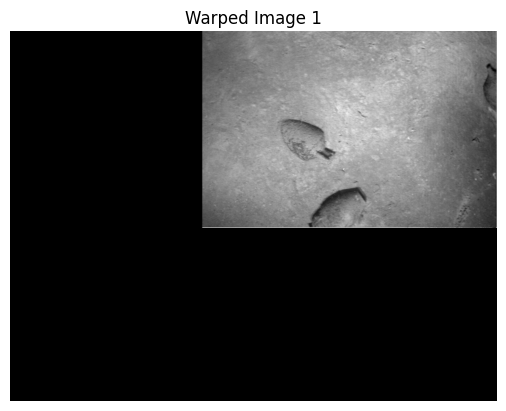

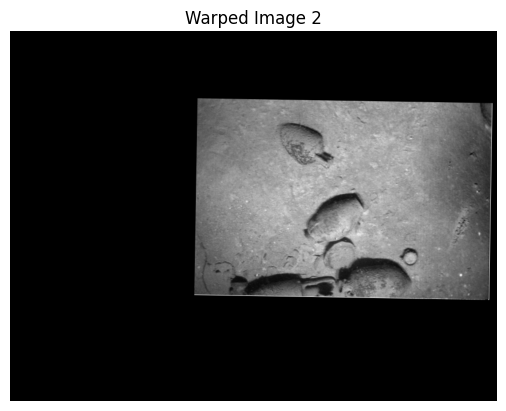

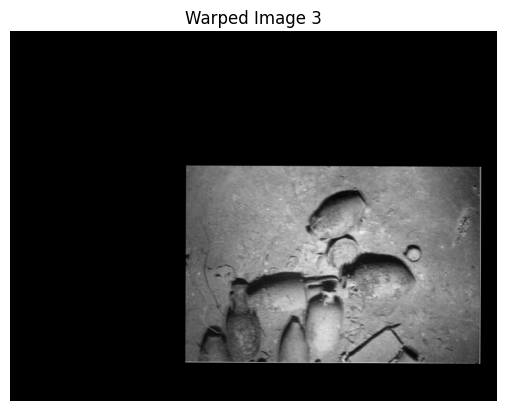

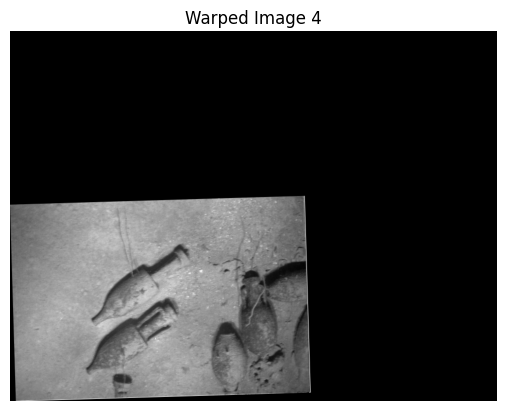

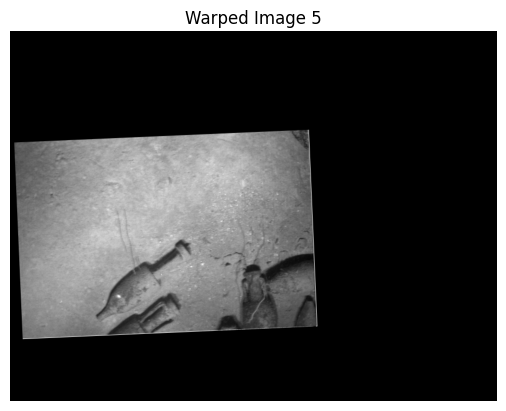

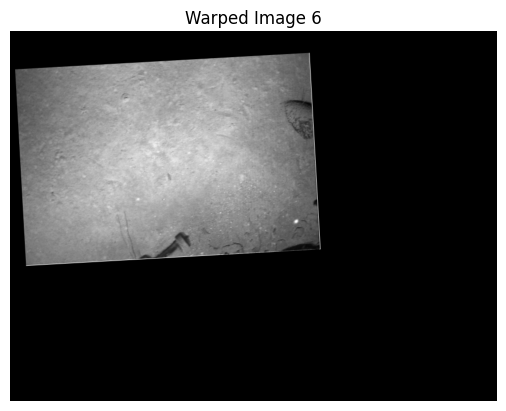

In [33]:
warped_images_post6 = warp_images(gray_images6, num_images6, homographies_post_opt6, min_x_post6, min_y_post6, max_x_post6, max_y_post6)

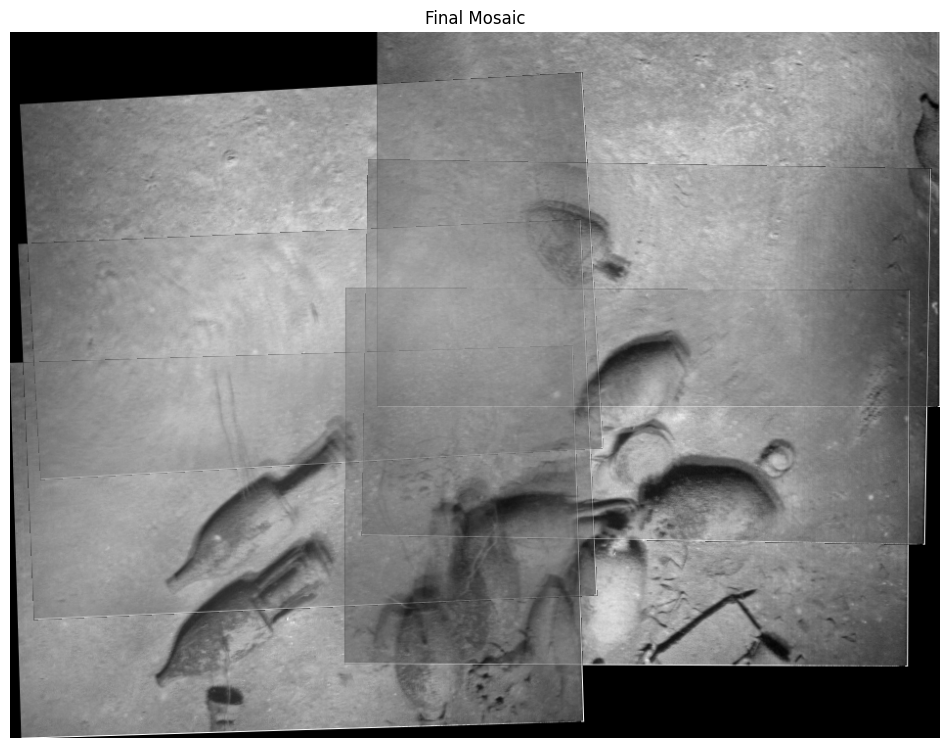

In [34]:
show_panoroma(warped_images_post6, homographies_post_opt6, gray_images6[0].shape, min_x_post6, min_y_post6)

28


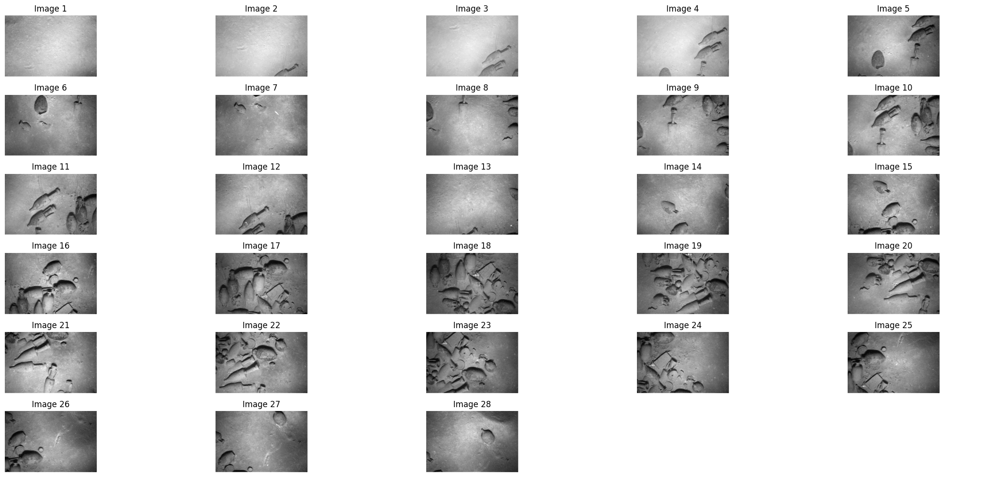

In [ ]:
og_images28, gray_images28, num_images28 = read_imgs_from_folder("28images")

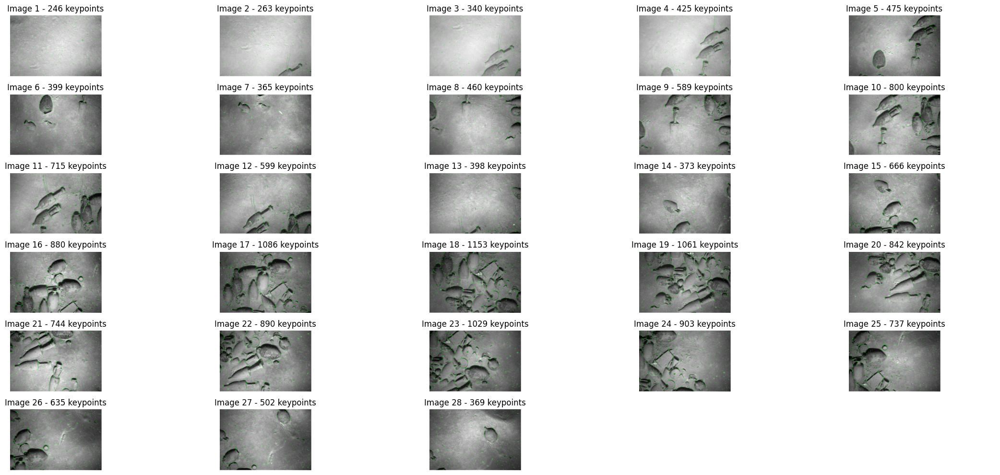

In [38]:
keypoints28, descriptors28 = detect_keypoints_lightglue(gray_images28, num_images28)

/var/folders/dr/b4jts9fx0zb33y0318vlywv40000gn/T/ipykernel_8968/2342493552.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


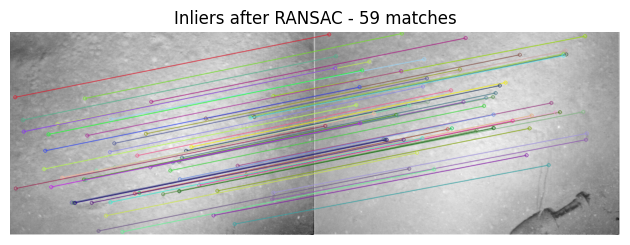

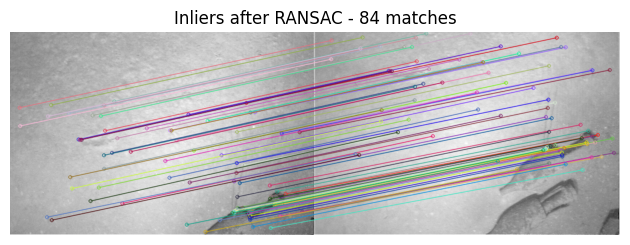

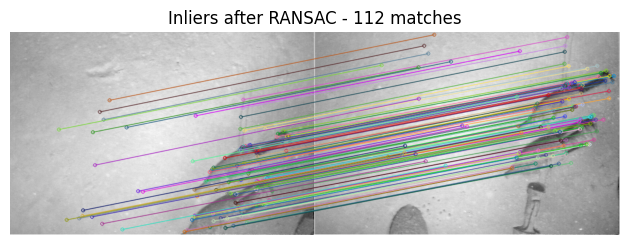

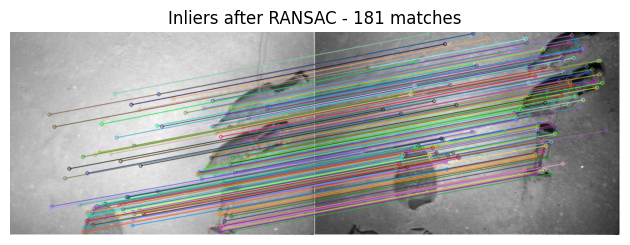

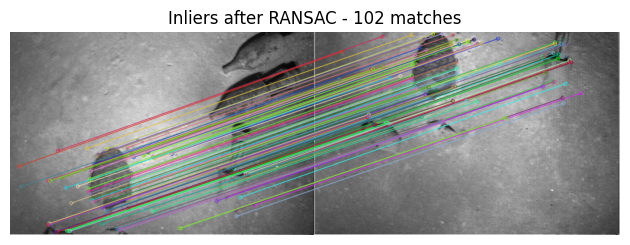

...

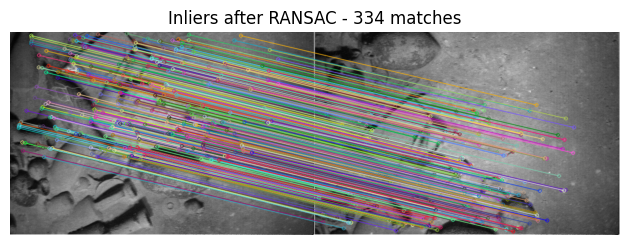

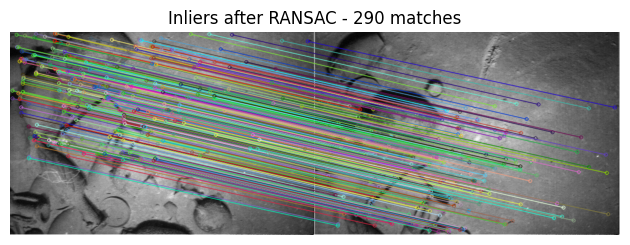

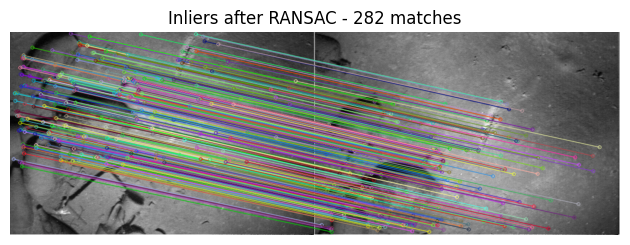

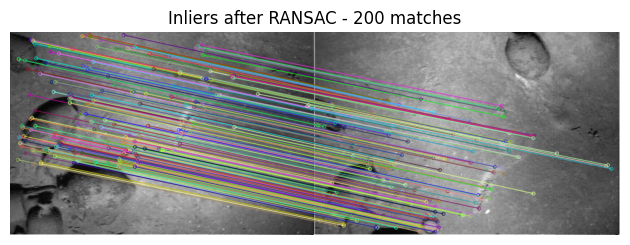

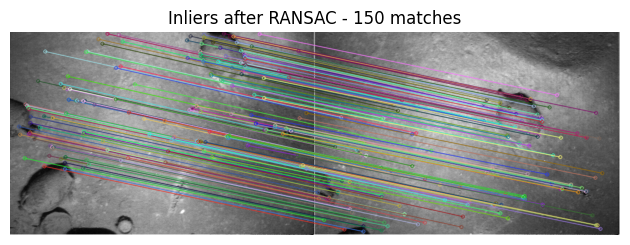

In [39]:
homographies28, temporal_matches28 = show_lightglue_matches(gray_images28, num_images28, keypoints28, descriptors28)

In [40]:
homographies_for_mosaic28 = get_homography(num_images28, homographies28)
homographies_for_mosaic28

[array([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]),
 array([[ 9.94739695e-01,  1.01242581e-02, -1.46943635e+01],
        [-1.01242581e-02,  9.94739695e-01,  1.22546869e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.80118736e-01,  3.45254214e-02, -2.32486719e+01],
        [-3.45254214e-02,  9.80118736e-01,  2.54680027e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.78927908e-01,  4.64090225e-02, -5.54345565e+01],
        [-4.64090225e-02,  9.78927908e-01,  3.76571440e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.73237852e-01,  4.61073881e-02, -6.51448642e+01],
        [-4.61073881e-02,  9.73237852e-01,  4.85692020e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[ 9.46882942e-01,  4.11892947e-02, -8.26046991e+01],
        [-4.11892947e-02,  9.46882942e-01,  6.93940109e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array(

In [41]:
minx28, miny28, maxx28, maxy28 = calculate_canvas_size(homographies_for_mosaic28, gray_images28[0].shape)
print(minx28, miny28, maxx28, maxy28)

-103.38757 -33.690273 1377.2838 1202.2095


/var/folders/dr/b4jts9fx0zb33y0318vlywv40000gn/T/ipykernel_8968/886839077.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


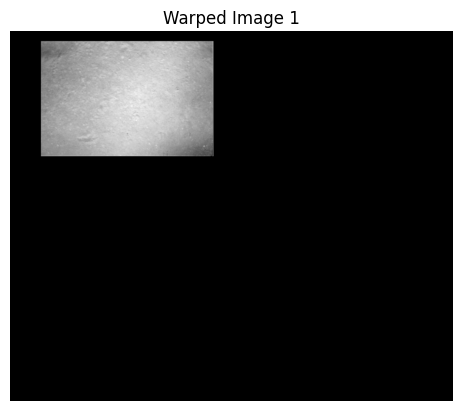

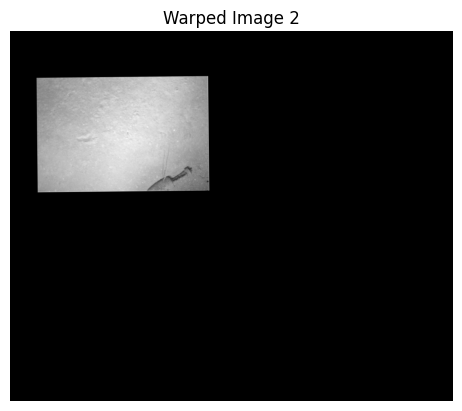

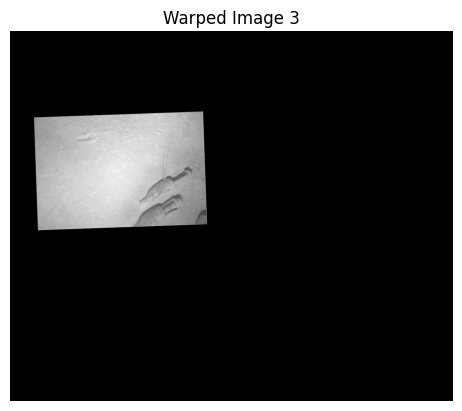

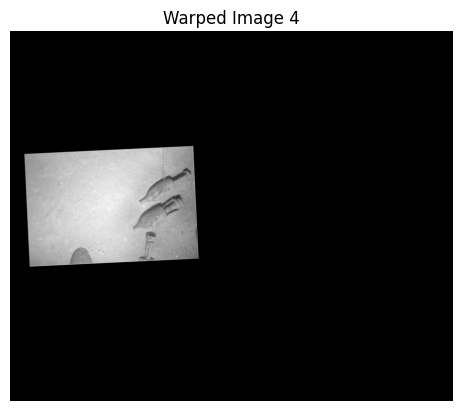

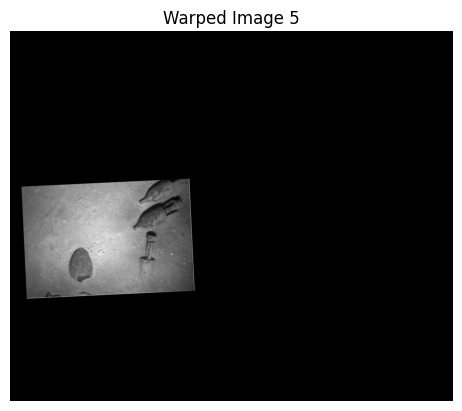

...

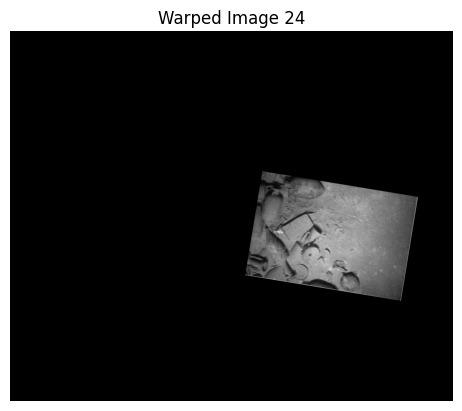

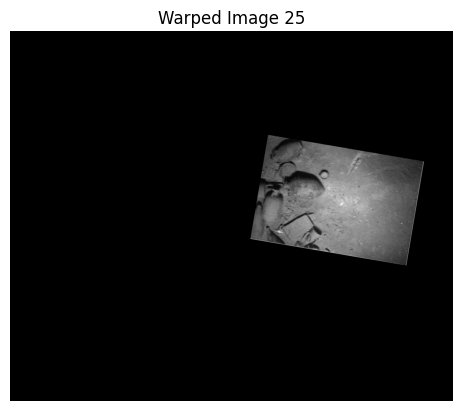

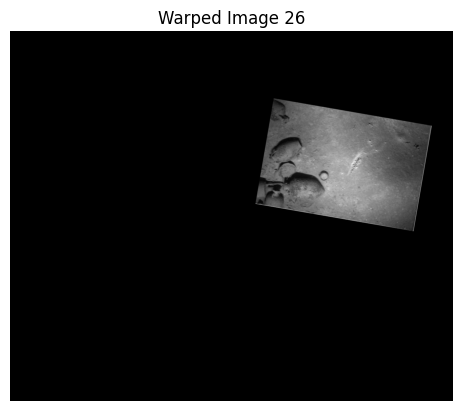

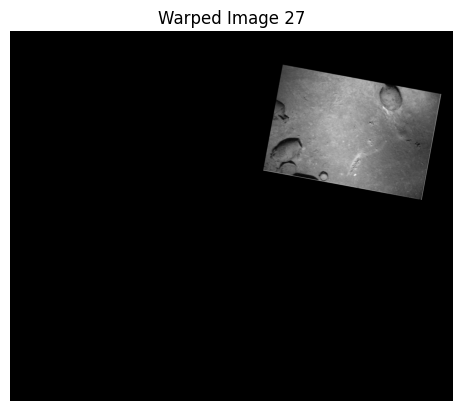

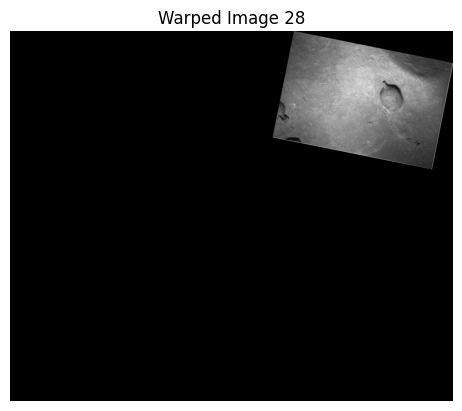

In [42]:
warped_images28 = warp_images(gray_images28, num_images28, homographies_for_mosaic28, minx28, miny28, maxx28, maxy28)

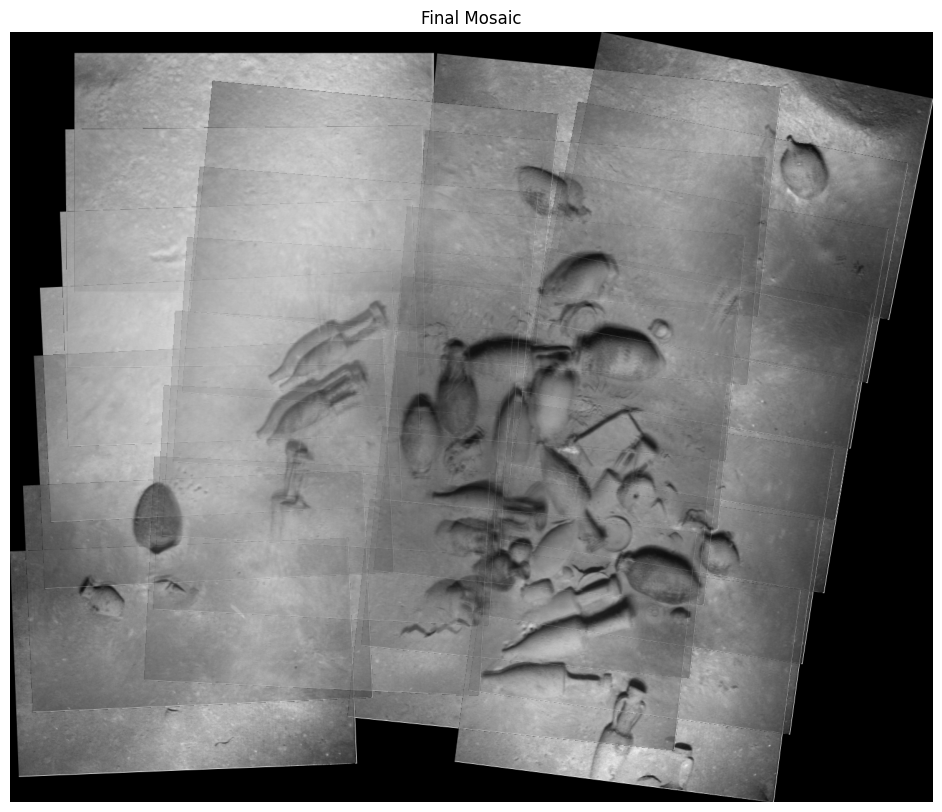

In [43]:
show_panoroma(warped_images28, homographies_for_mosaic28, gray_images28[0].shape, minx28, miny28)

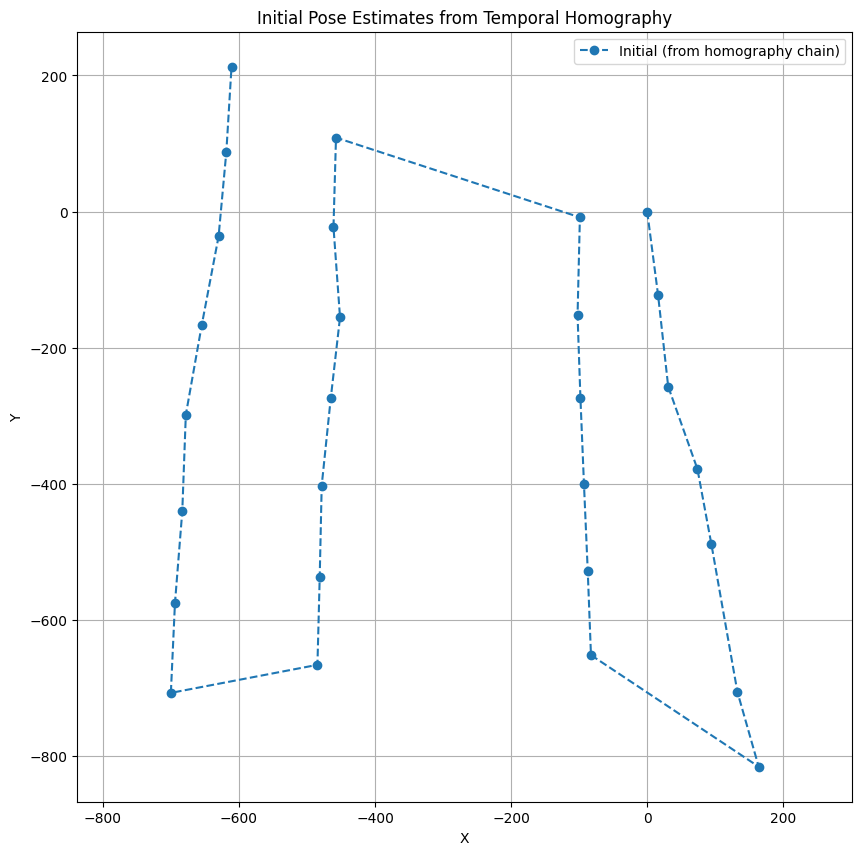

In [44]:
# Get initial pose estimates
initial_pose_estimates28 = get_initial_pose_estimates(homographies28)

# Extract initial poses for plotting
px_init28 = np.array([p[0] for p in initial_pose_estimates28])
py_init28 = np.array([p[1] for p in initial_pose_estimates28])

# Plot initial poses
plt.figure(figsize=(10, 10))
plt.plot(px_init28, py_init28, "--o", label="Initial (from homography chain)")
plt.axis("equal")
plt.grid(True)
plt.title("Initial Pose Estimates from Temporal Homography")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

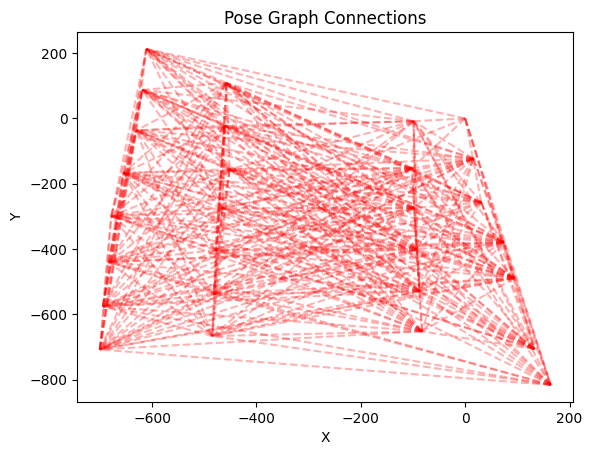

In [45]:
non_temporal_matches28 = non_temporal_matching(gray_images28, keypoints28, descriptors28, num_images28, temporal_matches28)
# Plot non-temporal connections
for (src, dst) in non_temporal_matches28.keys():
    plt.plot([px_init28[src], px_init28[dst]], [py_init28[src], py_init28[dst]],
            'r--', alpha=0.3, label=f"{src}→{dst}" if len(non_temporal_matches28) < 10 else "")

plt.title("Pose Graph Connections")
plt.xlabel("X")
plt.ylabel("Y")
if len(non_temporal_matches28) < 10:
    plt.legend()
plt.show()

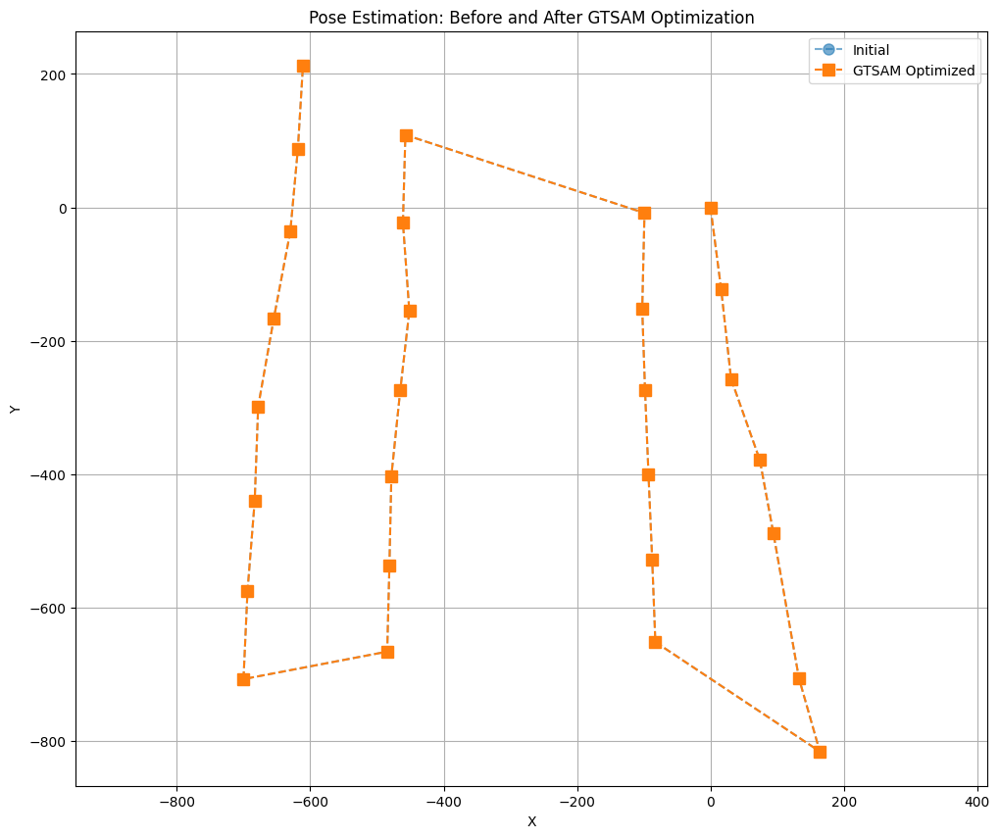

In [46]:
# Build and optimize pose graph
graph28, initial_estimates28 = build_pose_graph(initial_pose_estimates28, temporal_matches28, non_temporal_matches28, num_images28, 1, 10)

result28, marginals28 = optimize_poses(graph28, initial_estimates28)

# Extract optimized poses
gtsam_x28 = []
gtsam_y28 = []
gtsam_theta28 = []
for i in range(1, num_images28+1):
    pose28 = result28.atPose2(i)
    gtsam_x28.append(pose28.x())
    gtsam_y28.append(pose28.y())
    gtsam_theta28.append(pose28.theta())

# Plot comparison
plt.figure(figsize=(12, 10))
plt.plot(px_init28, py_init28, "--o", markersize=8, label="Initial", alpha=0.6)
plt.plot(gtsam_x28, gtsam_y28, "--s", markersize=8, label="GTSAM Optimized")

plt.axis("equal")
plt.grid(True)
plt.title("Pose Estimation: Before and After GTSAM Optimization")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

In [47]:
# homographies_post_opt = [np.identity(3)]
homographies_post_opt28 = get_homography_post_optimization(result28, num_images28)
homographies_post_opt28

[matrix([[ 1., -0., -0.],
         [ 0.,  1., -0.],
         [ 0.,  0.,  1.]]),
 matrix([[ 9.99948210e-01, -1.01772693e-02, -1.60242619e+01],
         [ 1.01772693e-02,  9.99948210e-01,  1.23031820e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99380150e-01, -3.52039192e-02, -3.08508029e+01],
         [ 3.52039192e-02,  9.99380150e-01,  2.57227156e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.98878131e-01, -4.73548228e-02, -7.38404204e+01],
         [ 4.73548228e-02,  9.98878131e-01,  3.78469673e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.98879678e-01, -4.73221761e-02, -9.43534152e+01],
         [ 4.73221761e-02,  9.98879678e-01,  4.89020789e+02],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 matrix([[ 9.99055221e-01, -4.34587826e-02, -1.32625444e+02],
         [ 4.34587826e-02,  9.99055221e-01,  7.06167111e+02],
         [ 0.00000000e+00,  0.00000000e+00, 

In [48]:
min_x_post28, min_y_post28, max_x_post28, max_y_post28 = calculate_canvas_size(homographies_post_opt28, gray_images28[0].shape)

/var/folders/dr/b4jts9fx0zb33y0318vlywv40000gn/T/ipykernel_8968/886839077.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


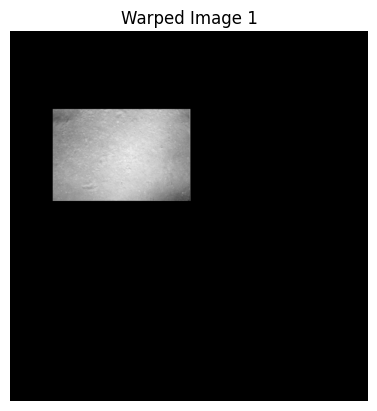

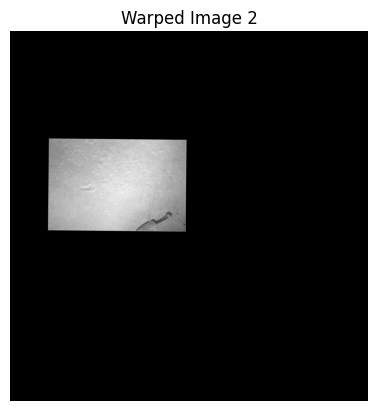

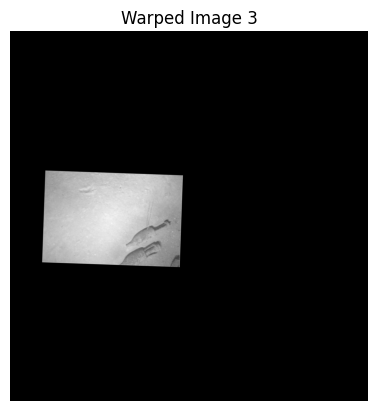

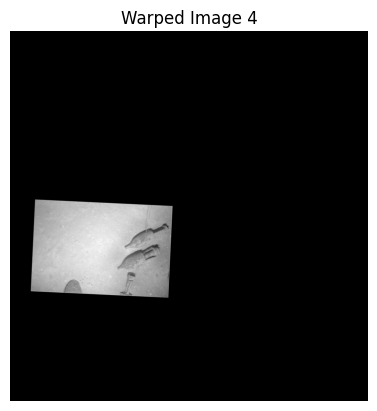

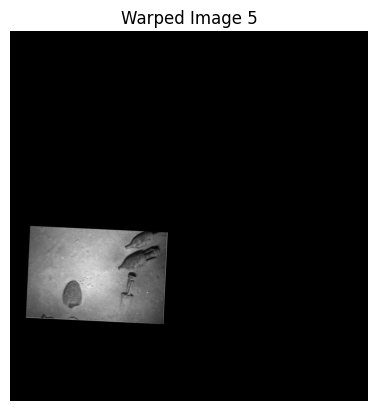

...

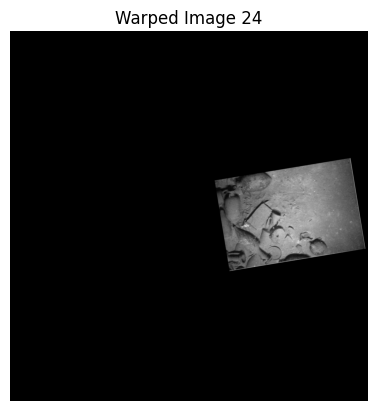

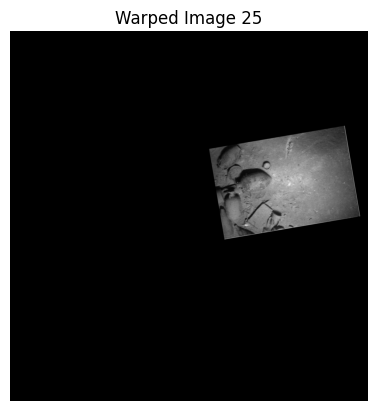

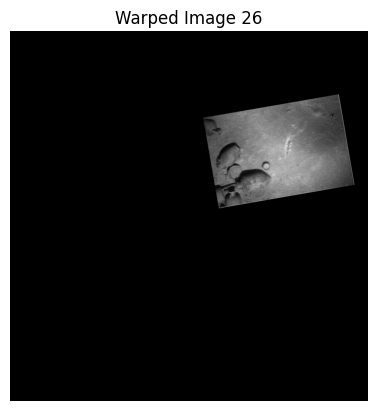

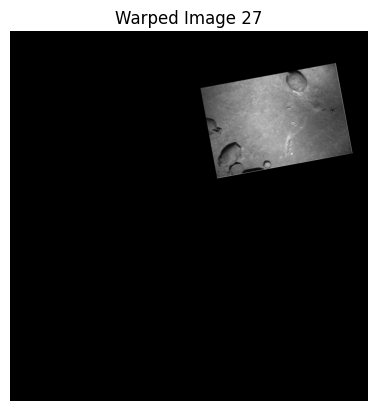

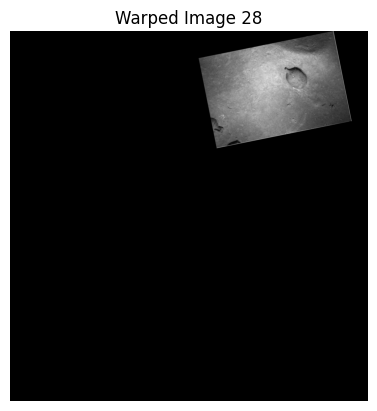

In [49]:
warped_images_post28 = warp_images(gray_images28, num_images28, homographies_post_opt28, min_x_post28, min_y_post28, max_x_post28, max_y_post28)

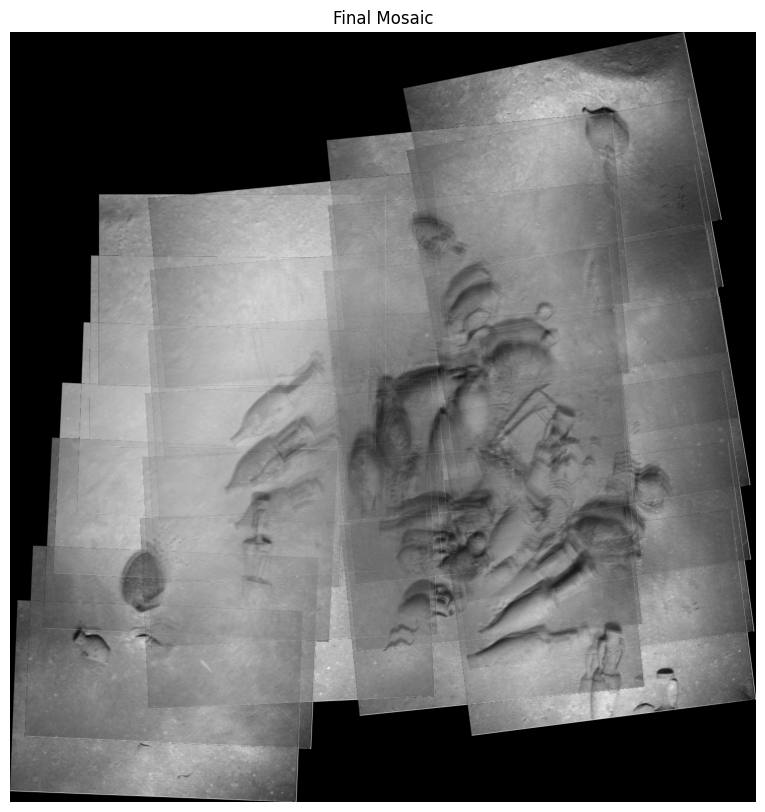

In [50]:
show_panoroma(warped_images_post28, homographies_post_opt28, gray_images28[0].shape, min_x_post28, min_y_post28)